## Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
!pip install google.cloud.vision

     |████████████████████████████████| 419kB 2.8MB/s 


In [0]:
from google.cloud import vision
from google.cloud.vision import types
import io
from PIL import Image, ImageDraw
from enum import Enum
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"]='text recognition-15767ba032d4.json'

## Functions

In [0]:
def detect_all_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()

    image = vision.types.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
        print('\n"{}"'.format(text.description))

        vertices = (['({},{})'.format(vertex.x, vertex.y)
                    for vertex in text.bounding_poly.vertices])

        print('bounds: {}'.format(','.join(vertices)))

In [0]:
def detect_text(path):
    """Detects text in the file."""
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()

    image = types.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')
    boxes = {}
    for text in texts:
      if ('E' in text.description or 'F' in text.description):
        print(text.description)
        vertices = (['({},{})'.format(vertex.x, vertex.y) for vertex in text.bounding_poly.vertices])
        print('bounds: {}'.format(','.join(vertices)))
        boxes['E' if 'E' in text.description else 'F'] = (','.join(vertices))
    return boxes

In [16]:
path ='drive/My Drive/Fuel Meter/txt_mudit_b11_11982.jpg'
boxes  = detect_text(path)
#detect_all_text(path)

Texts:
120
km/h
40
140
20
160
180
EL
F
36098
23 02. 2016

bounds: (233,10),(909,10),(909,650),(233,650)
EL
bounds: (337,300),(438,322),(430,359),(329,337)
F
bounds: (545,341),(574,348),(567,378),(538,371)


In [17]:
boxes

{'E': '(337,300),(438,322),(430,359),(329,337)',
 'F': '(545,341),(574,348),(567,378),(538,371)'}

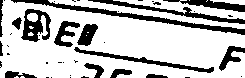

percentage of black pixels: 0.9677440996122315


In [69]:
thresh(im)

In [0]:
def thresh(im):
  gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
  med = cv2.medianBlur(gray,5)
  th = cv2.adaptiveThreshold(med,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
  #ret,th1 = cv2.threshold(gray,190,255,cv2.THRESH_BINARY)
  cv2_imshow(th)
  blacks = cv2.countNonZero(th)
  img_size = im.shape[0]*im.shape[1]*im.shape[0]
  per = blacks*100/img_size
  print("percentage of black pixels:", per)

In [0]:
def plot_box(img_path, boxes):
  img = cv2.imread(img_path)
  #img = cv2.rectangle()
  x1 = boxes['E'][1:4]
  y1 = boxes['E'][5:8]
  x2 = boxes['F'][11:14]
  y2 = boxes['F'][15:18]
  x3 = boxes['F'][21:24]
  y3 = boxes['F'][25:28]
  x4 = boxes['E'][31:34]
  y4 = boxes['E'][35:38]
  pts = np.array([[x1,y1],[x2,y2],[x3,y3],[x4,y4]], np.int32)
  pts = pts.reshape((-1,1,2))
  #cv2.polylines(img,[pts],True,(0,255,255))
  #cv2_imshow(img)
  
  a = min(pts[0][0][1],pts[1][0][1],pts[2][0][1],pts[3][0][1])
  b = max(pts[0][0][1],pts[1][0][1],pts[2][0][1],pts[3][0][1])
  c = min(pts[0][0][0],pts[1][0][0],pts[2][0][0],pts[3][0][0])
  d = max(pts[0][0][0],pts[1][0][0],pts[2][0][0],pts[3][0][0])
  im = img[a:b,c:d]
  cv2_imshow(im)
  thresh(im)

## Plots

txt_mudit_b11_43.jpg
Texts:
20
km/h
40
Mas4
140
(0)
56 7
20
160
x000RP
180
e!
FN
E
295
km
03.01.2017

bounds: (60,0),(756,0),(756,542),(60,542)
FN
bounds: (278,224),(336,237),(326,279),(268,266)
E
bounds: (190,211),(226,220),(220,242),(184,232)


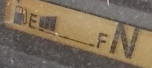

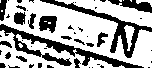

percentage of black pixels: 0.9728988344563831
txt_mudit_b11_644.jpg
Texts:
80 100
60
120
km/h
40
140
20
160
180
E
17548
18.5.2016

bounds: (232,53),(758,53),(758,538),(232,538)
E
bounds: (284,261),(332,272),(327,294),(279,282)
#### Cound not detect fuel meter ####
txt_mudit_b11_748.jpg
Texts:
0
160
EI
F
I23 129
km
B0
27.06. 2016

bounds: (0,0),(758,0),(758,538),(0,538)
EI
bounds: (371,185),(512,190),(510,243),(369,238)
F
bounds: (599,206),(633,208),(631,243),(597,241)


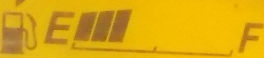

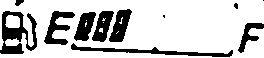

percentage of black pixels: 1.3410712355421035
txt_mudit_b11_11505.jpg
Texts:
18
3063
E I
F
km
LL

bounds: (171,152),(1279,152),(1279,607),(171,607)
E
bounds: (171,554),(224,549),(229,601),(176,607)
F
bounds: (422,555),(468,553),(470,597),(424,599)


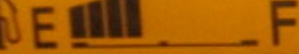

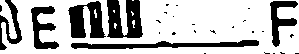

percentage of black pixels: 1.346853480508875
txt_mudit_b11_11535.jpg
Texts:
km/h
140
160
20
180
RAKE
06/10/2016 17:41
60
40

bounds: (9,0),(594,0),(594,418),(9,418)
RAKE
bounds: (9,224),(37,224),(37,235),(9,235)
#### Cound not detect fuel meter ####
txt_mudit_b11_11939.jpg
Texts:
#### Cound not detect fuel meter ####
txt_mudit_b11_11932.jpg
Texts:
120
140
D0#0
_F
54 198m
180
15.12.2016

bounds: (65,0),(758,0),(758,538),(65,538)
_F
bounds: (463,285),(515,308),(504,335),(451,313)
#### Cound not detect fuel meter ####
txt_mudit_b11_11936.jpg
Texts:
#### Cound not detect fuel meter ####
txt_mudit_b11_11957.jpg
Texts:
(O)
F
EI
13 769m
29.08. 2016

bounds: (323,37),(1527,37),(1527,1099),(323,1099)
F
bounds: (716,406),(784,405),(785,469),(717,470)
EI
bounds: (323,442),(536,408),(547,474),(333,508)


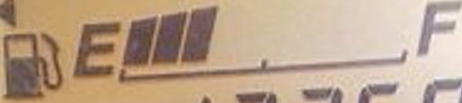

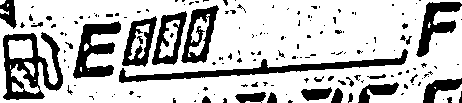

percentage of black pixels: 0.7257376425064237
txt_mudit_b11_11975.jpg
Texts:
5:53
8086
E A
km
6
08.03.201

bounds: (229,222),(765,222),(765,543),(229,543)
E
bounds: (553,399),(573,399),(573,420),(553,420)
#### Cound not detect fuel meter ####
txt_mudit_b11_11987.jpg
Texts:
80 100
60
120
km/h
40
140
0
20
160
180
63926
BE
10.08.2016 13:55

bounds: (99,24),(758,24),(758,554),(99,554)
BE
bounds: (145,333),(187,335),(186,359),(144,357)
#### Cound not detect fuel meter ####
txt_mudit_b11_11985.jpg
Texts:
80 100
120
km/h
60
40
140
20
160
E
10 752
km
180
05.03.2016

bounds: (1,177),(971,177),(971,689),(1,689)
E
bounds: (449,347),(502,345),(503,364),(450,366)
#### Cound not detect fuel meter ####
txt_mudit_b11_11990.jpg
Texts:
60
80 100
km/h
(O)
20
E F
2 1B62
09.12.2016 15:46
120 140 160 180
40

bounds: (25,21),(766,21),(766,547),(25,547)
E
bounds: (453,260),(477,265),(470,301),(445,296)
F
bounds: (549,281),(608,294),(600,330),(541,317)


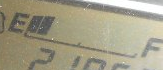

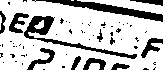

percentage of black pixels: 1.0852635532740704
txt_mudit_b11_11998.jpg
Texts:
gO 0S ל
60 0 תו
140
<ס
km/h
160
180
E
5856 km
-F
מוm
05.11.2016
ווייו!!1Ti,ו
20

bounds: (213,16),(758,16),(758,538),(213,538)
E
bounds: (245,270),(280,282),(275,299),(239,287)
-F
bounds: (326,306),(341,312),(336,325),(321,319)


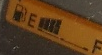

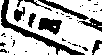

percentage of black pixels: 1.2889321017663264
txt_mudit_b11_11982.jpg
Texts:
120
km/h
40
140
20
160
180
EL
F
36098
23 02. 2016

bounds: (233,10),(909,10),(909,650),(233,650)
EL
bounds: (337,300),(438,322),(430,359),(329,337)
F
bounds: (545,341),(574,348),(567,378),(538,371)


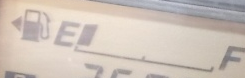

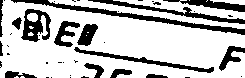

percentage of black pixels: 0.9677440996122315
txt_mudit_b11_11984.jpg
Texts:
#### Cound not detect fuel meter ####
txt_mudit_b11_11988.jpg
Texts:
40
160
20
180
EN
_F
5699
09. 10. 2016

bounds: (166,53),(1223,53),(1223,874),(166,874)
EN
bounds: (520,480),(675,480),(675,531),(520,531)
_F
bounds: (769,476),(903,477),(902,532),(768,531)


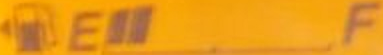

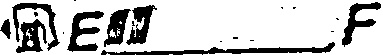

percentage of black pixels: 1.423990678203828
txt_mudit_b11_12016.jpg
Texts:
180
18429
km
_F
E
31/12/2015

bounds: (133,64),(746,64),(746,524),(133,524)
_F
bounds: (395,290),(462,287),(463,319),(396,322)
E
bounds: (136,292),(239,299),(236,342),(133,335)


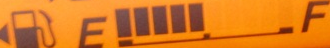

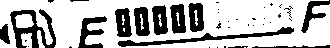

percentage of black pixels: 1.5018676346801347
txt_mudit_b11_12024.jpg
Texts:
140
40
20
160
180
E
F
02.02.2016

bounds: (252,0),(606,0),(606,441),(252,441)
E
bounds: (304,124),(336,127),(335,140),(303,137)
F
bounds: (398,133),(407,134),(405,145),(396,144)


percentage of black pixels: 3.560526774812489
txt_mudit_b11_12025.jpg
Texts:
160
20
0
180
CNG
F 4I864
DE
km
25/11/2015

bounds: (125,24),(793,24),(793,524),(125,524)
F
bounds: (259,226),(349,237),(345,274),(254,263)
DE
bounds: (222,229),(266,235),(263,256),(219,250)


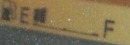

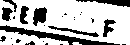

percentage of black pixels: 1.6303893637226972
txt_mudit_b11_12019.jpg
Texts:
bu
km/h
140
40
160
20
180
DE
F
ikm
06.12.2015

bounds: (49,0),(763,0),(763,541),(49,541)
DE
bounds: (136,429),(196,429),(196,463),(136,463)
F
bounds: (327,437),(342,437),(341,464),(326,464)


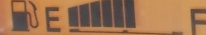

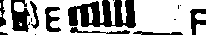

percentage of black pixels: 1.8597186447394491
txt_mudit_b11_12169.jpg
Texts:
#### Cound not detect fuel meter ####
txt_mudit_b11_12428.jpg
Texts:
80 100
60
120
km/h
140
160
180
e!
PETROL
CNG
CNG
166 Ham
E
04.08.2016

bounds: (476,77),(1516,77),(1516,1076),(476,1076)
PETROL
bounds: (665,597),(780,593),(781,615),(666,619)
E
bounds: (831,692),(860,693),(859,738),(830,737)
#### Cound not detect fuel meter ####


In [72]:
# Extracted image
path ='drive/My Drive/Fuel Meter/'
for img in os.listdir(path):
  img_path = os.path.join(path, img)
  print("Image:", img)
  boxes  = detect_text(img_path)
  if len(boxes)<2:
    print("#### Cound not detect fuel meter ####")
    #cv2_imshow(cv2.imread(img_path))
  else:
    plot_box(img_path, boxes)

Texts:
20
km/h
40
Mas4
140
(0)
56 7
20
160
x000RP
180
e!
FN
E
295
km
03.01.2017

bounds: (60,0),(756,0),(756,542),(60,542)
20
km/h
40
Mas4
140
(0)
56 7
20
160
x000RP
180
e!
FN
E
295
km
03.01.2017

bounds: (60,0),(756,0),(756,542),(60,542)
FN
bounds: (278,224),(336,237),(326,279),(268,266)
E
bounds: (190,211),(226,220),(220,242),(184,232)


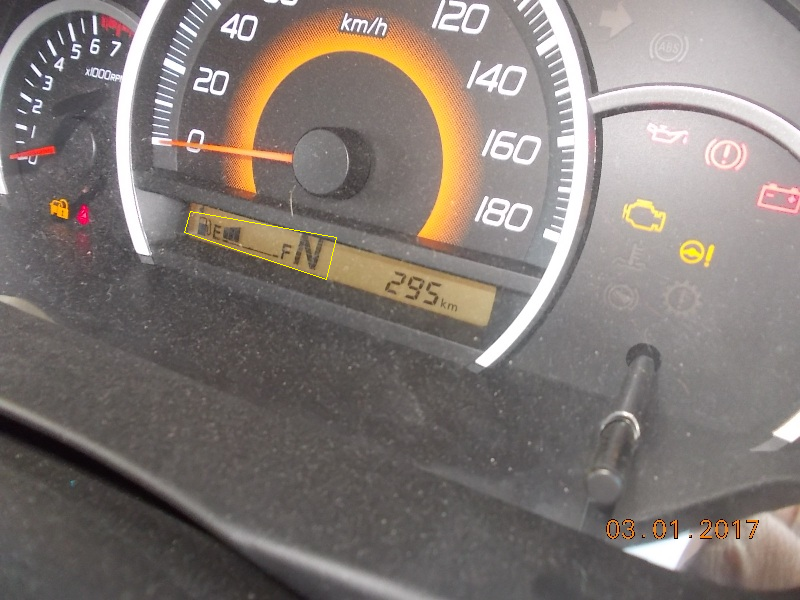

Texts:
80 100
60
120
km/h
40
140
20
160
180
E
17548
18.5.2016

bounds: (232,53),(758,53),(758,538),(232,538)
E
bounds: (284,261),(332,272),(327,294),(279,282)
Cound not detect fuel meter


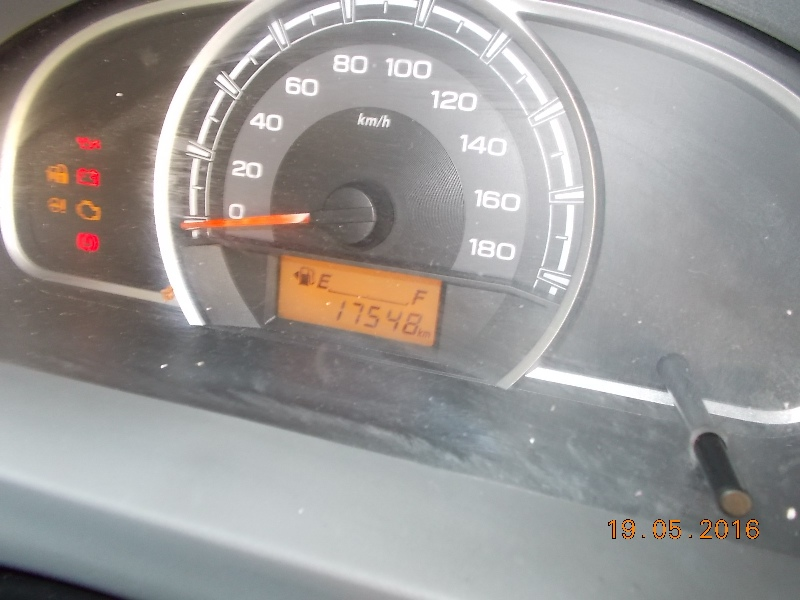

Texts:
0
160
EI
F
I23 129
km
B0
27.06. 2016

bounds: (0,0),(758,0),(758,538),(0,538)
0
160
EI
F
I23 129
km
B0
27.06. 2016

bounds: (0,0),(758,0),(758,538),(0,538)
EI
bounds: (371,185),(512,190),(510,243),(369,238)
F
bounds: (599,206),(633,208),(631,243),(597,241)


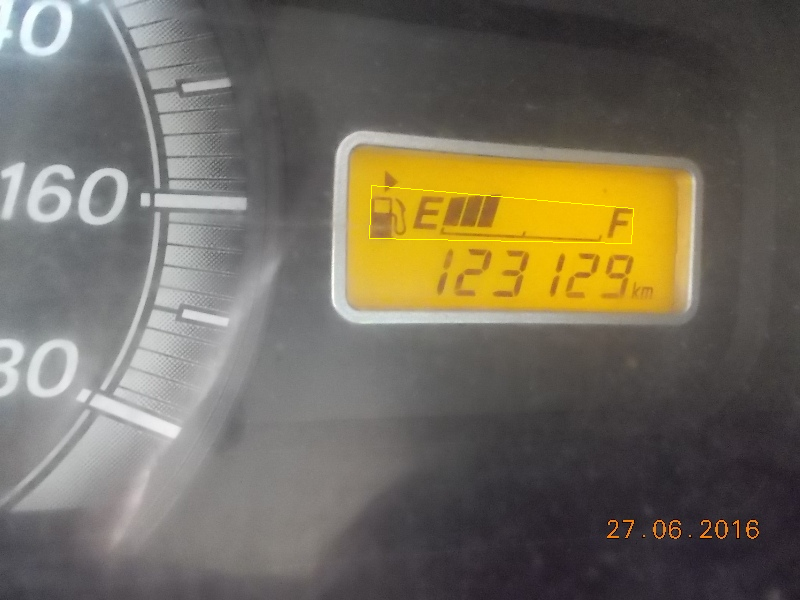

Texts:
18
3063
E I
F
km
LL

bounds: (171,152),(1279,152),(1279,607),(171,607)
18
3063
E I
F
km
LL

bounds: (171,152),(1279,152),(1279,607),(171,607)
E
bounds: (171,554),(224,549),(229,601),(176,607)
F
bounds: (422,555),(468,553),(470,597),(424,599)


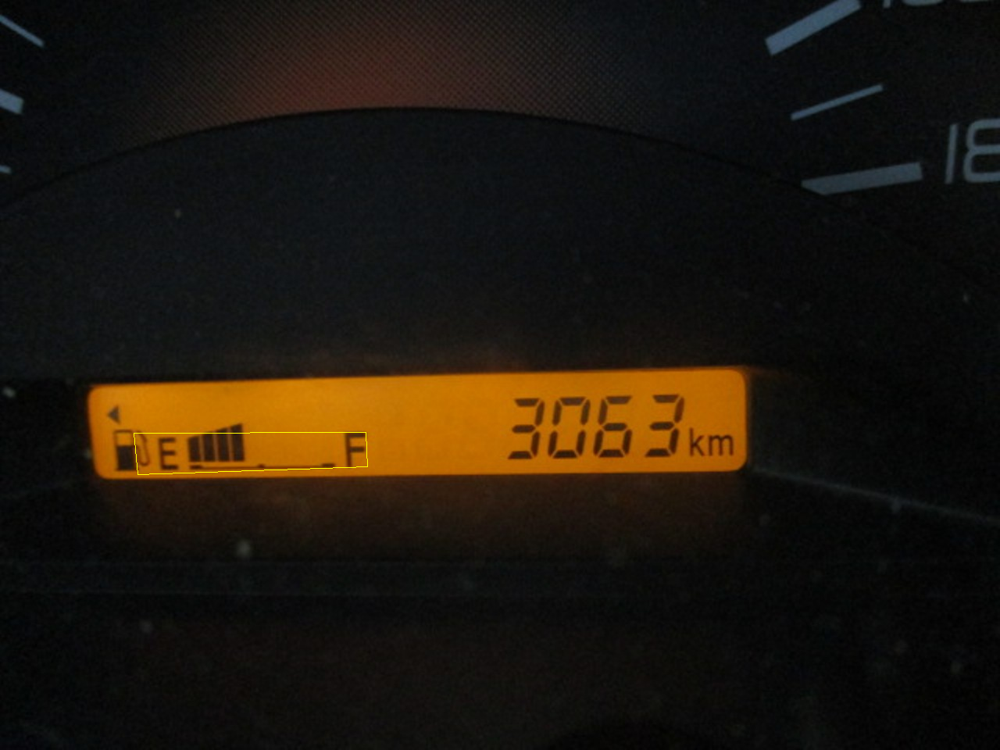

Texts:
km/h
140
160
20
180
RAKE
06/10/2016 17:41
60
40

bounds: (9,0),(594,0),(594,418),(9,418)
RAKE
bounds: (9,224),(37,224),(37,235),(9,235)
Cound not detect fuel meter


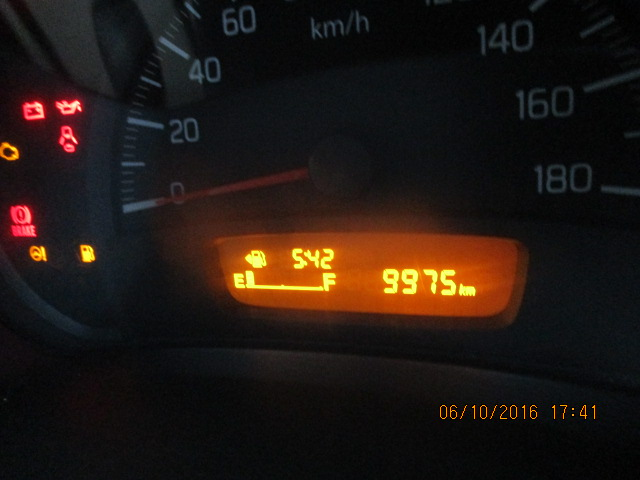

Texts:
Cound not detect fuel meter


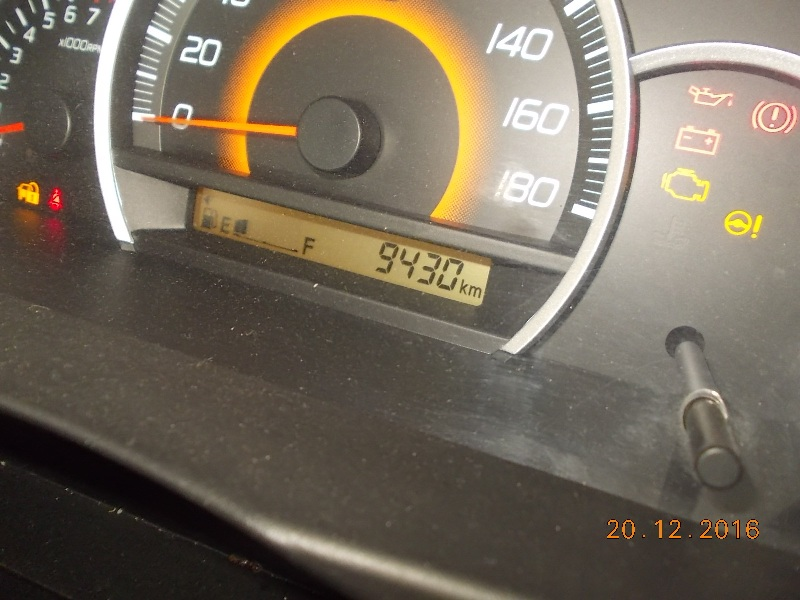

Texts:
120
140
D0#0
_F
54 198m
180
15.12.2016

bounds: (65,0),(758,0),(758,538),(65,538)
_F
bounds: (463,285),(515,308),(504,335),(451,313)
Cound not detect fuel meter


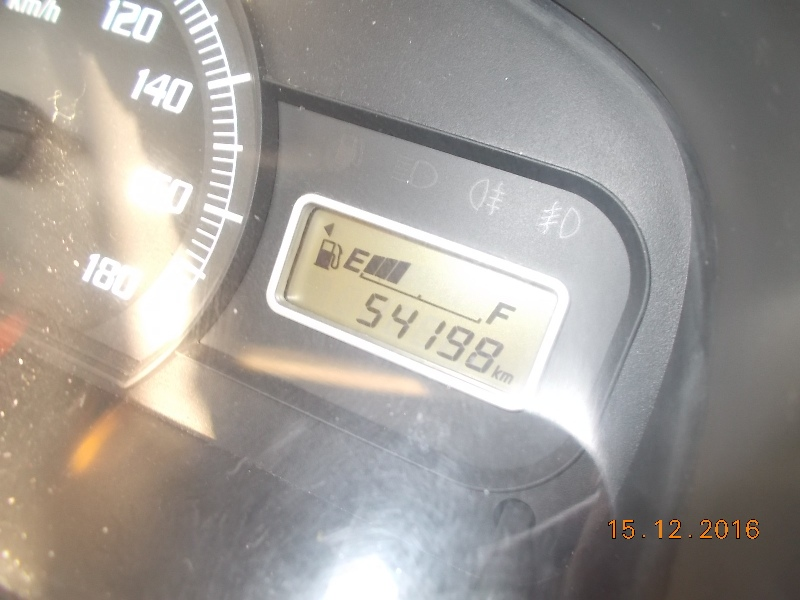

Texts:
Cound not detect fuel meter


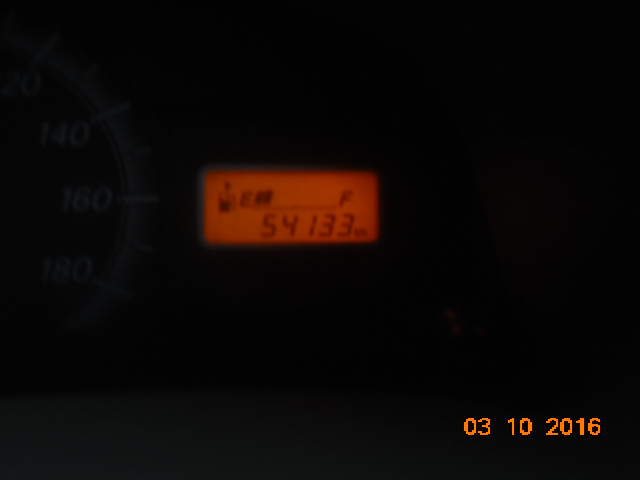

Texts:
(O)
F
EI
13 769m
29.08. 2016

bounds: (323,37),(1527,37),(1527,1099),(323,1099)
(O)
F
EI
13 769m
29.08. 2016

bounds: (323,37),(1527,37),(1527,1099),(323,1099)
F
bounds: (716,406),(784,405),(785,469),(717,470)
EI
bounds: (323,442),(536,408),(547,474),(333,508)


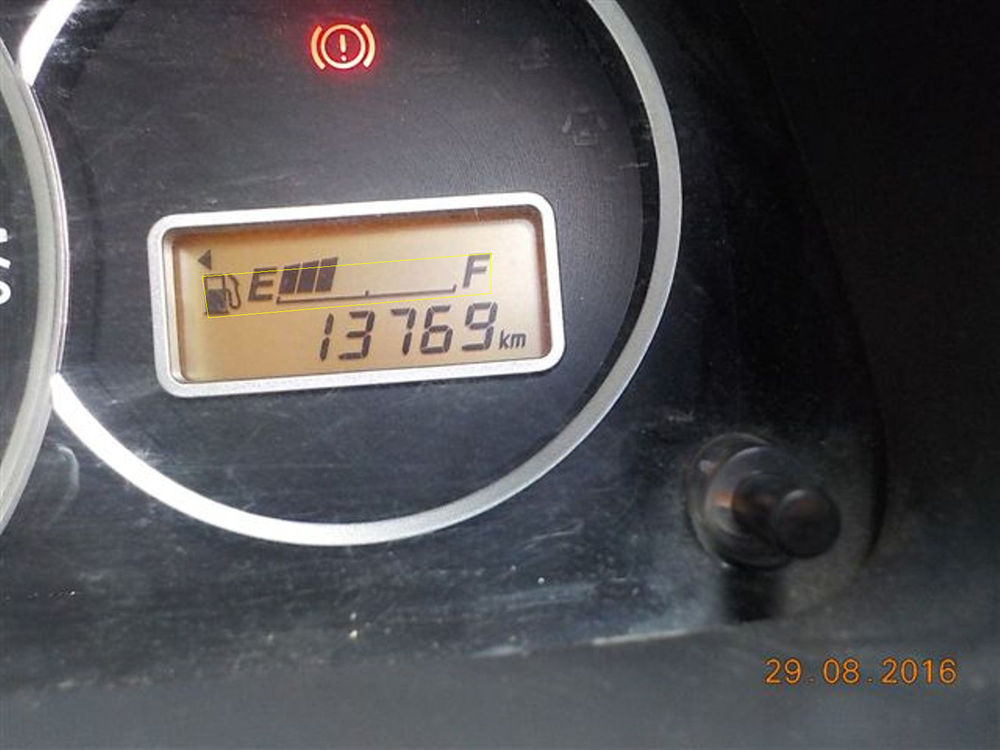

Texts:
5:53
8086
E A
km
6
08.03.201

bounds: (229,222),(765,222),(765,543),(229,543)
E
bounds: (553,399),(573,399),(573,420),(553,420)
Cound not detect fuel meter


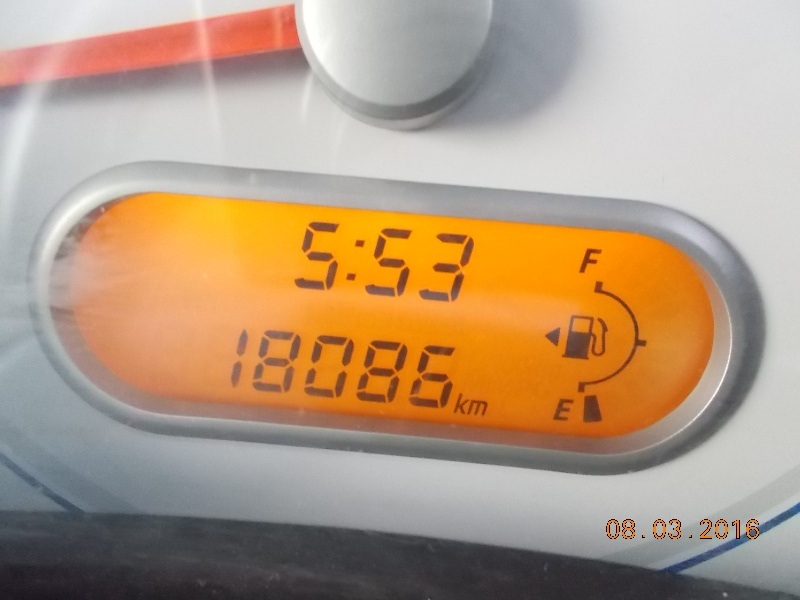

Texts:
80 100
60
120
km/h
40
140
0
20
160
180
63926
BE
10.08.2016 13:55

bounds: (99,24),(758,24),(758,554),(99,554)
BE
bounds: (145,333),(187,335),(186,359),(144,357)
Cound not detect fuel meter


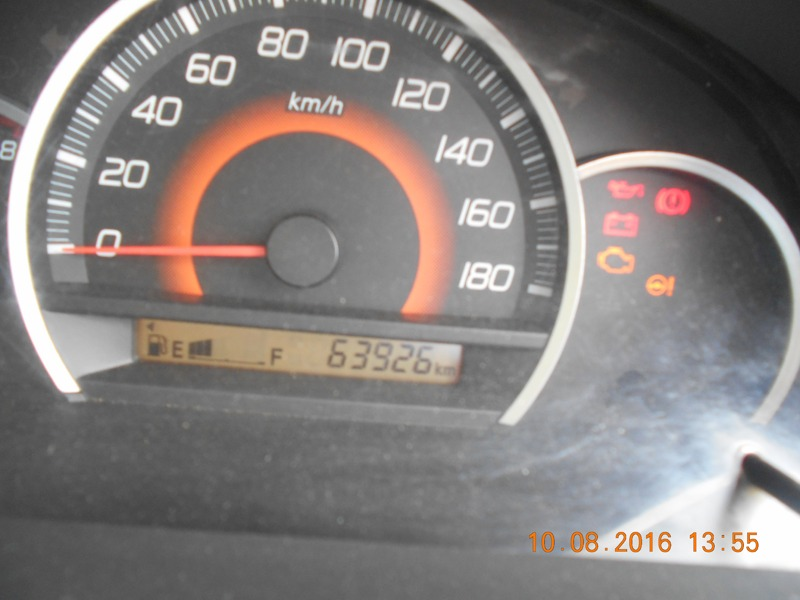

Texts:
80 100
120
km/h
60
40
140
20
160
E
10 752
km
180
05.03.2016

bounds: (1,177),(971,177),(971,689),(1,689)
E
bounds: (449,347),(502,345),(503,364),(450,366)
Cound not detect fuel meter


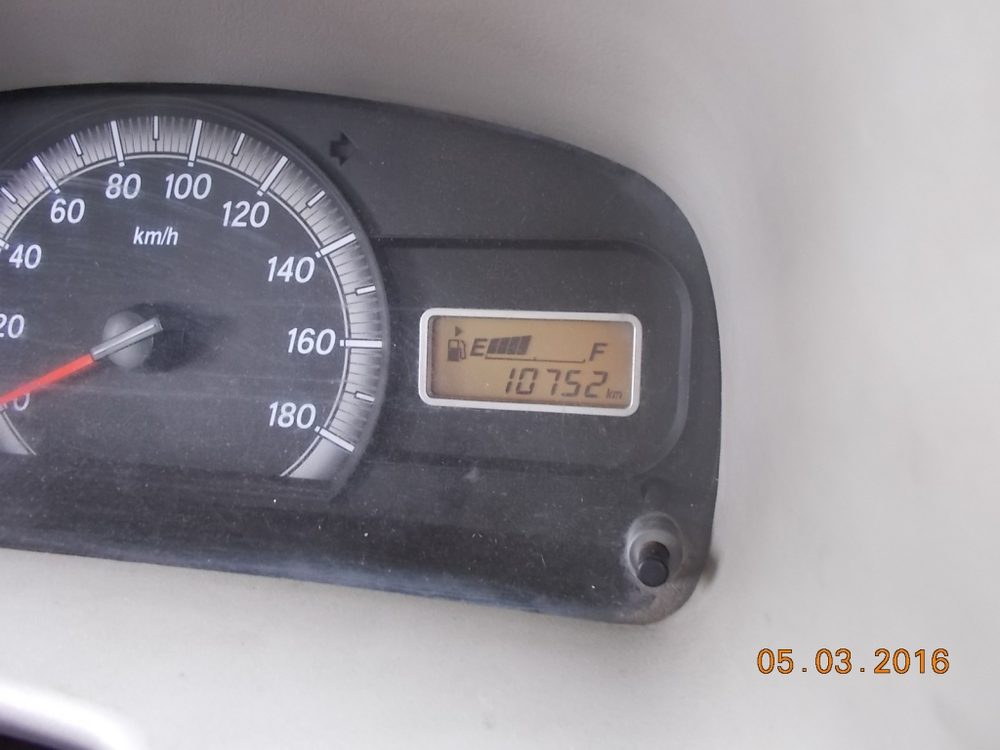

Texts:
60
80 100
km/h
(O)
20
E F
2 1B62
09.12.2016 15:46
120 140 160 180
40

bounds: (25,21),(766,21),(766,547),(25,547)
60
80 100
km/h
(O)
20
E F
2 1B62
09.12.2016 15:46
120 140 160 180
40

bounds: (25,21),(766,21),(766,547),(25,547)
E
bounds: (453,260),(477,265),(470,301),(445,296)
F
bounds: (549,281),(608,294),(600,330),(541,317)


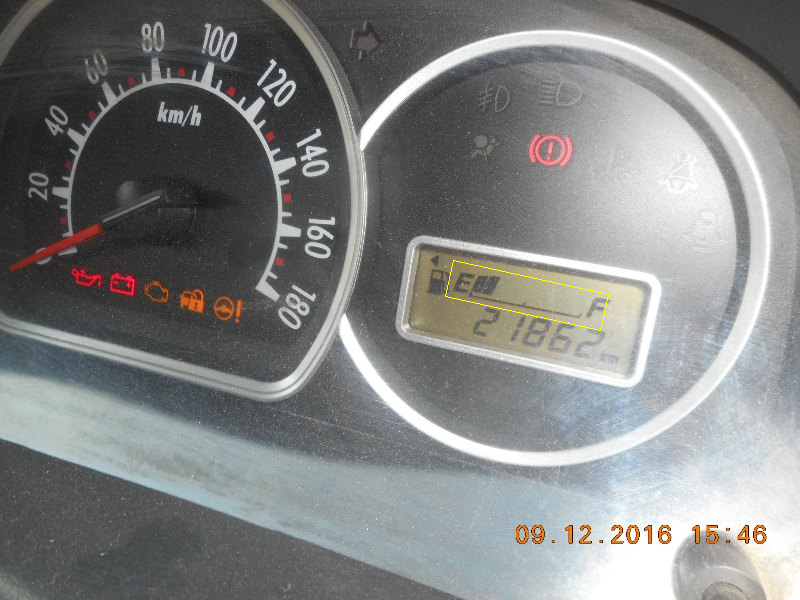

Texts:
gO 0S ל
60 0 תו
140
<ס
km/h
160
180
E
5856 km
-F
מוm
05.11.2016
ווייו!!1Ti,ו
20

bounds: (213,16),(758,16),(758,538),(213,538)
gO 0S ל
60 0 תו
140
<ס
km/h
160
180
E
5856 km
-F
מוm
05.11.2016
ווייו!!1Ti,ו
20

bounds: (213,16),(758,16),(758,538),(213,538)
E
bounds: (245,270),(280,282),(275,299),(239,287)
-F
bounds: (326,306),(341,312),(336,325),(321,319)


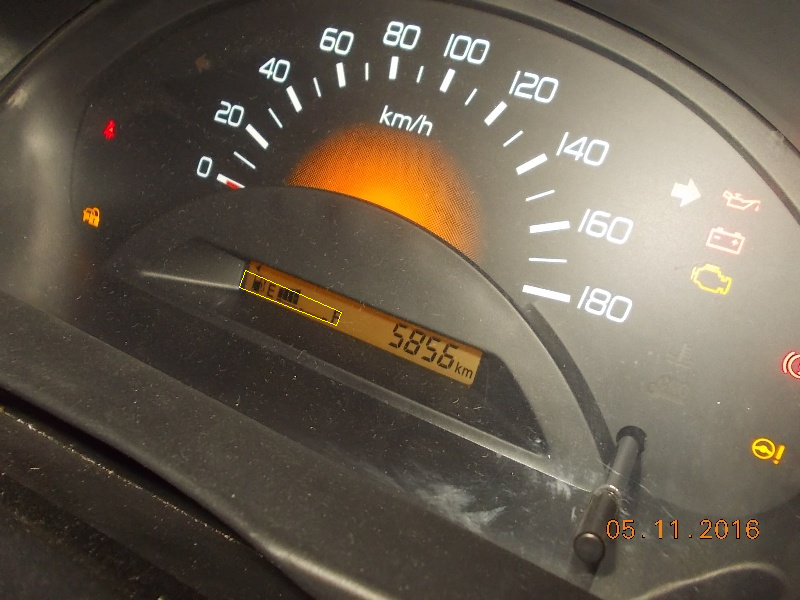

Texts:
120
km/h
40
140
20
160
180
EL
F
36098
23 02. 2016

bounds: (233,10),(909,10),(909,650),(233,650)
120
km/h
40
140
20
160
180
EL
F
36098
23 02. 2016

bounds: (233,10),(909,10),(909,650),(233,650)
EL
bounds: (337,300),(438,322),(430,359),(329,337)
F
bounds: (545,341),(574,348),(567,378),(538,371)


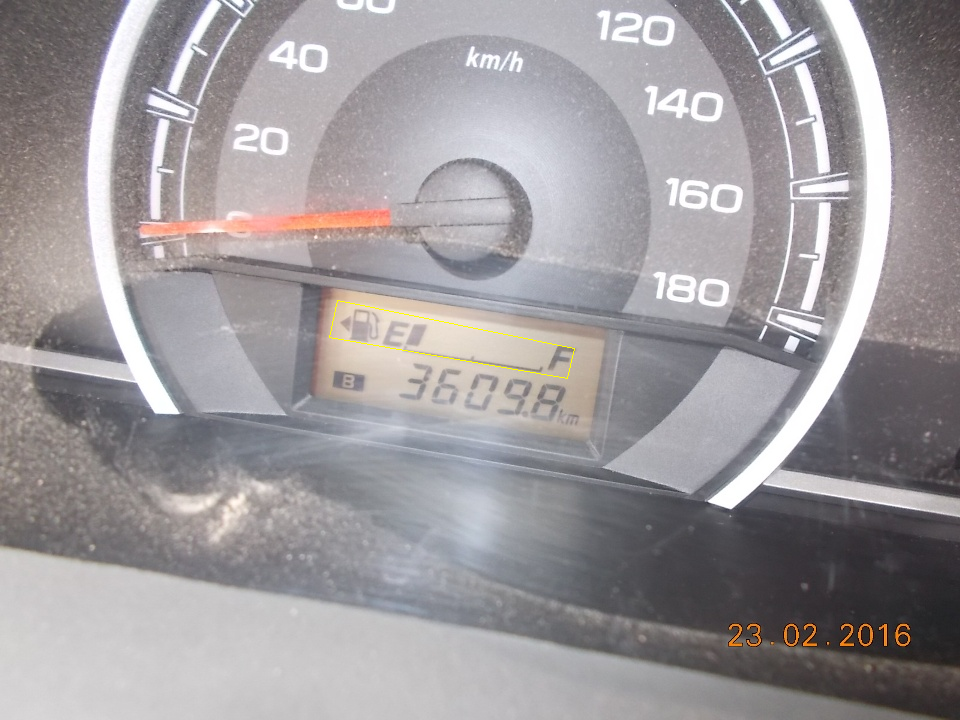

Texts:
Cound not detect fuel meter


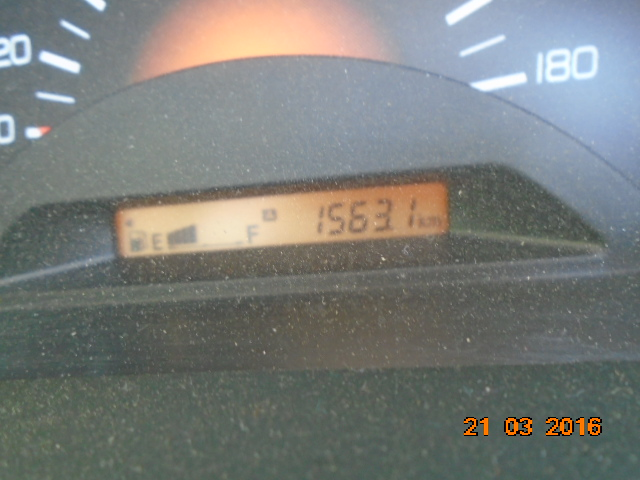

Texts:
40
160
20
180
EN
_F
5699
09. 10. 2016

bounds: (166,53),(1223,53),(1223,874),(166,874)
40
160
20
180
EN
_F
5699
09. 10. 2016

bounds: (166,53),(1223,53),(1223,874),(166,874)
EN
bounds: (520,480),(675,480),(675,531),(520,531)
_F
bounds: (769,476),(903,477),(902,532),(768,531)


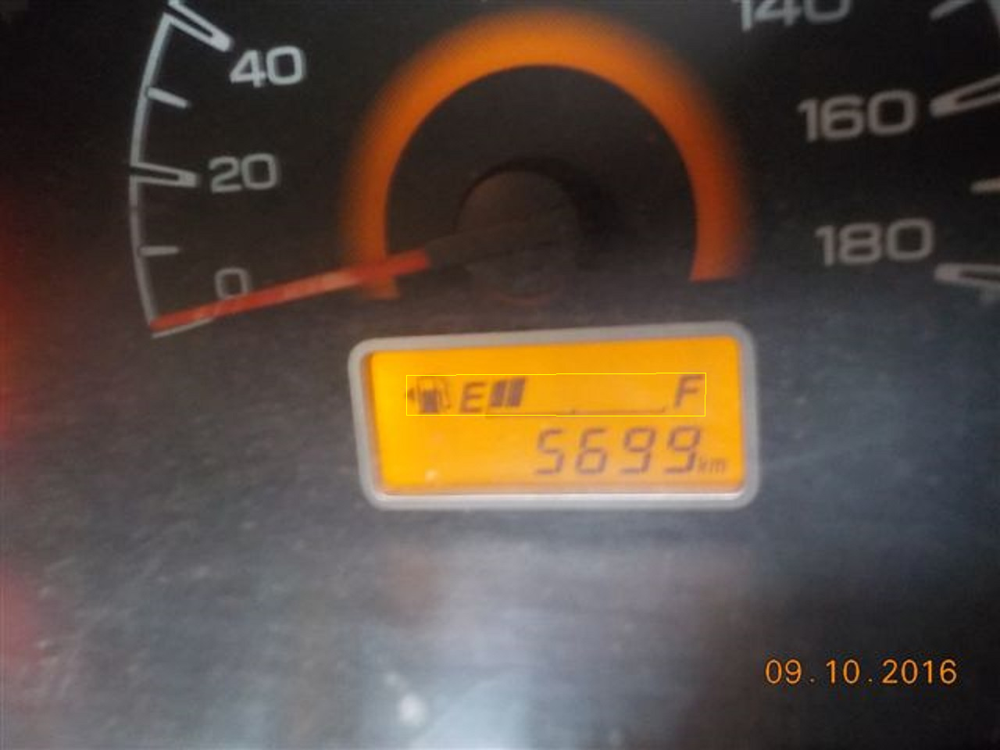

Texts:
180
18429
km
_F
E
31/12/2015

bounds: (133,64),(746,64),(746,524),(133,524)
180
18429
km
_F
E
31/12/2015

bounds: (133,64),(746,64),(746,524),(133,524)
_F
bounds: (395,290),(462,287),(463,319),(396,322)
E
bounds: (136,292),(239,299),(236,342),(133,335)


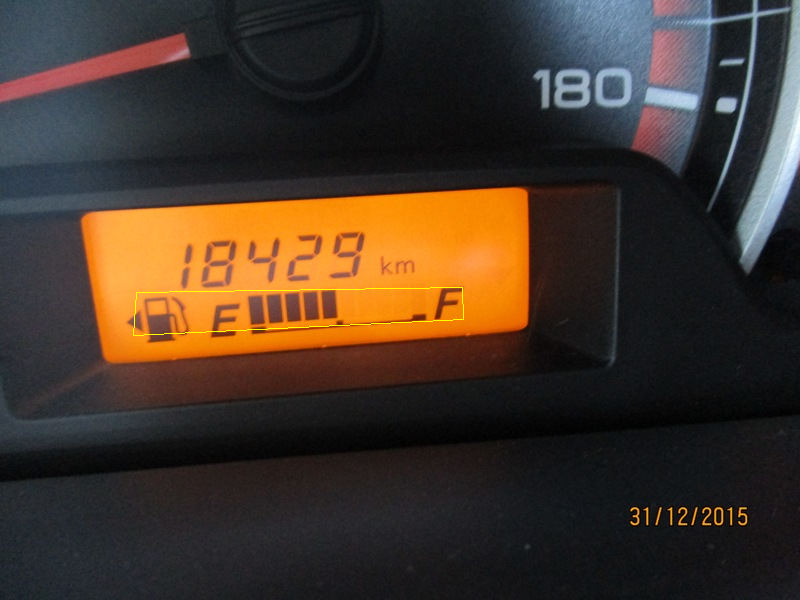

Texts:
140
40
20
160
180
E
F
02.02.2016

bounds: (252,0),(606,0),(606,441),(252,441)
140
40
20
160
180
E
F
02.02.2016

bounds: (252,0),(606,0),(606,441),(252,441)
E
bounds: (304,124),(336,127),(335,140),(303,137)
F
bounds: (398,133),(407,134),(405,145),(396,144)


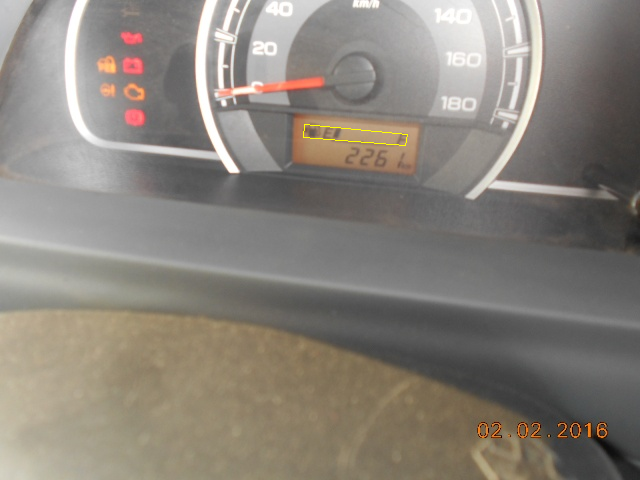

Texts:
160
20
0
180
CNG
F 4I864
DE
km
25/11/2015

bounds: (125,24),(793,24),(793,524),(125,524)
160
20
0
180
CNG
F 4I864
DE
km
25/11/2015

bounds: (125,24),(793,24),(793,524),(125,524)
F
bounds: (259,226),(349,237),(345,274),(254,263)
DE
bounds: (222,229),(266,235),(263,256),(219,250)


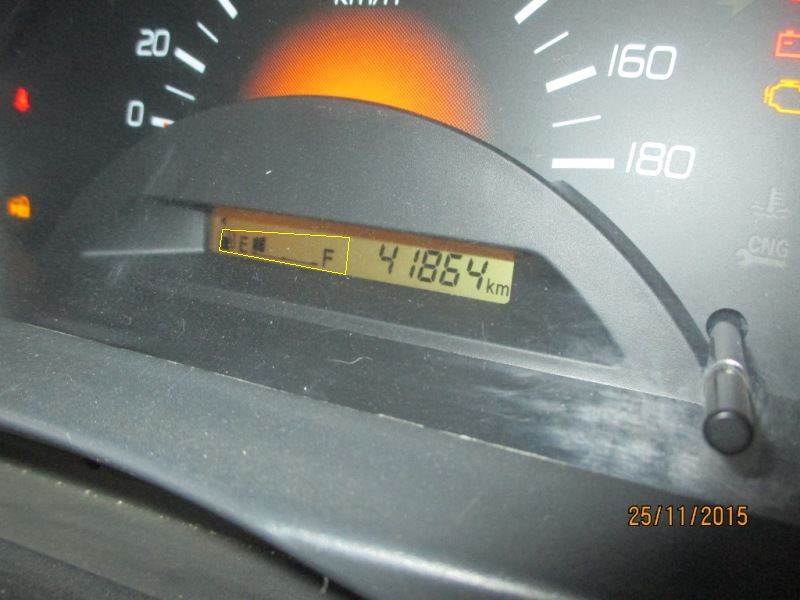

Texts:
bu
km/h
140
40
160
20
180
DE
F
ikm
06.12.2015

bounds: (49,0),(763,0),(763,541),(49,541)
bu
km/h
140
40
160
20
180
DE
F
ikm
06.12.2015

bounds: (49,0),(763,0),(763,541),(49,541)
DE
bounds: (136,429),(196,429),(196,463),(136,463)
F
bounds: (327,437),(342,437),(341,464),(326,464)


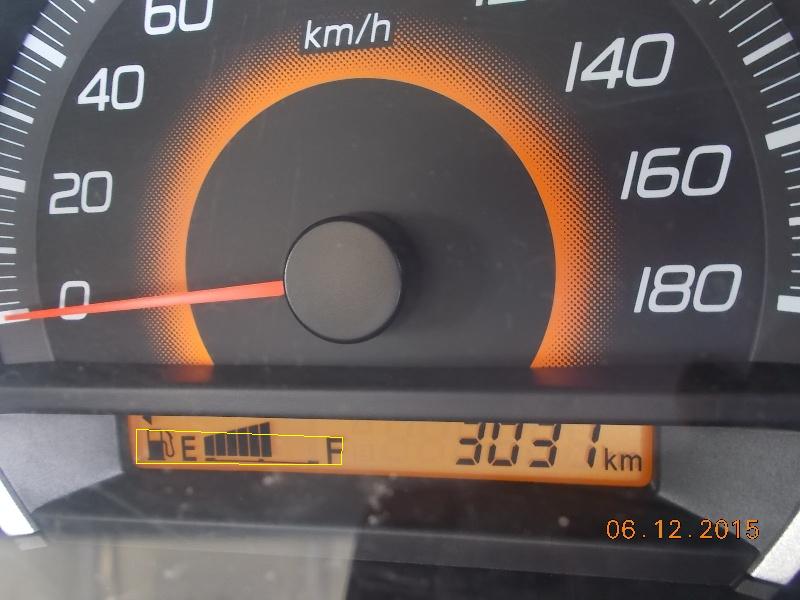

Texts:
Cound not detect fuel meter


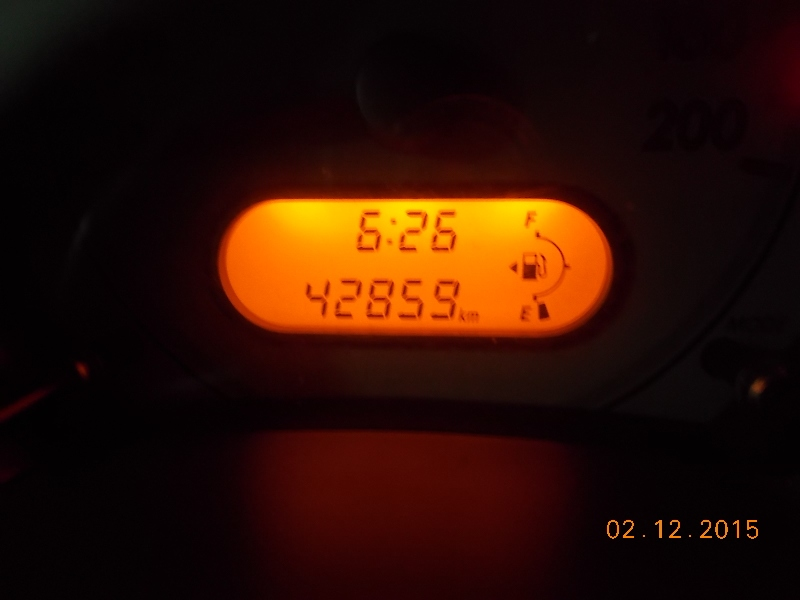

Texts:
80 100
60
120
km/h
140
160
180
e!
PETROL
CNG
CNG
166 Ham
E
04.08.2016

bounds: (476,77),(1516,77),(1516,1076),(476,1076)
PETROL
bounds: (665,597),(780,593),(781,615),(666,619)
E
bounds: (831,692),(860,693),(859,738),(830,737)
Cound not detect fuel meter


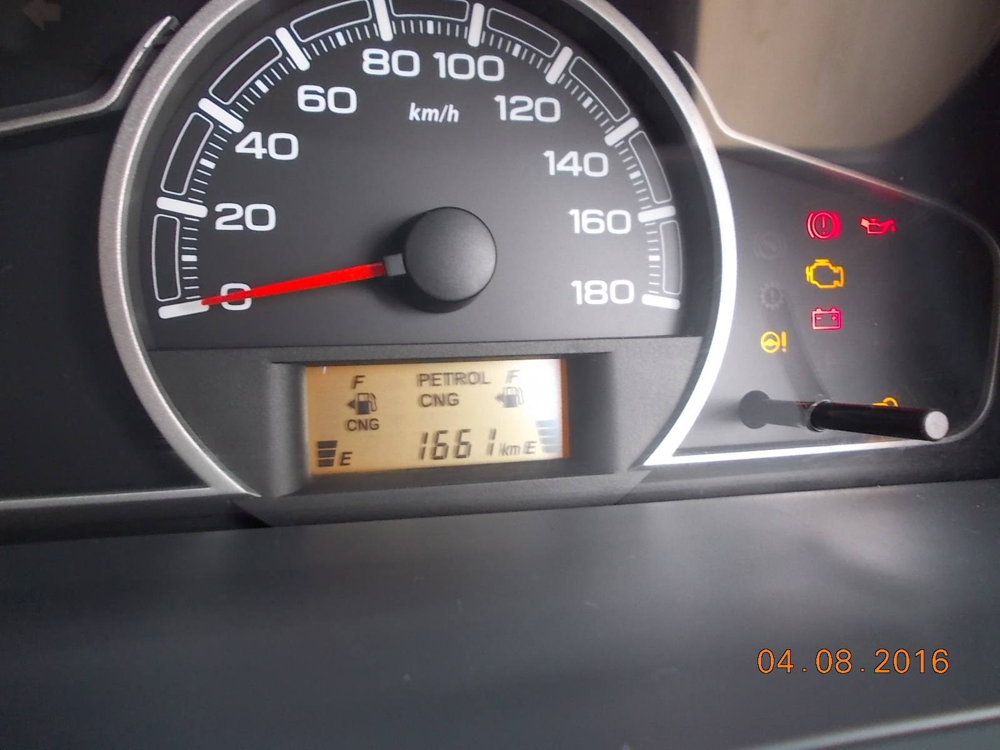

In [148]:
# Full image with boxes
path ='drive/My Drive/Fuel Meter/'
for img in os.listdir(path):
  img_path = os.path.join(path, img)
  boxes  = detect_text(img_path)
  if len(boxes)<2:
    print("Cound not detect fuel meter")
    cv2_imshow(cv2.imread(img_path))
  else:
    plot_box(img_path, boxes)

## Tesseract

In [0]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 7 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 2s (2,623 kB/s)
debconf: unable to initia

In [0]:
import pytesseract
import cv2
import shutil
import os
import random
from google.colab.patches import cv2_imshow
try:
  from PIL import Image
except ImportError:
  import Image

In [0]:
img = cv2.imread('drive/My Drive/Fuel Meter/txt_mudit_b11_11957.jpg')

In [0]:
im_gray = cv2.imread('drive/My Drive/Fuel Meter/txt_mudit_b11_11957.jpg', cv2.IMREAD_GRAYSCALE)

In [0]:
img = cv2.medianBlur(im_gray,9)

In [0]:
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

In [0]:
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)

In [0]:
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

In [0]:
(thresh, im) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

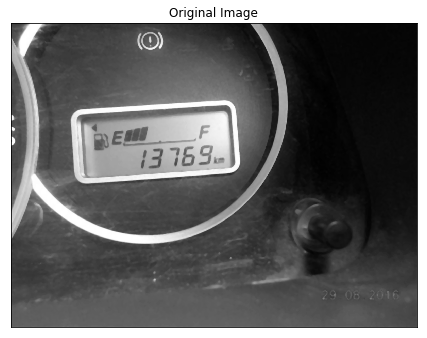

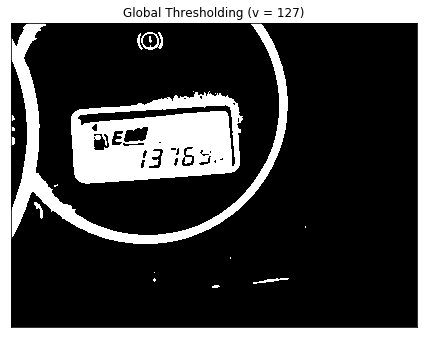

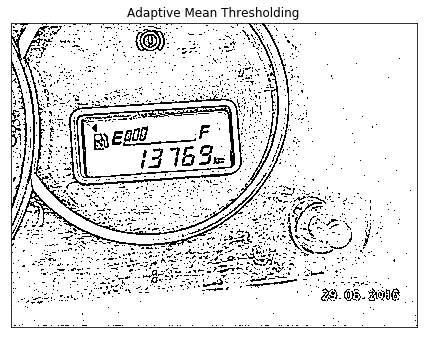

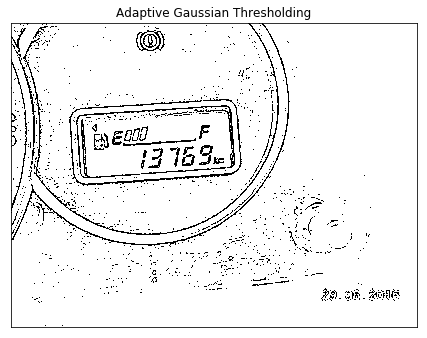

In [0]:
import matplotlib.pyplot as plt
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in range(4):
    plt.figure(figsize = (16,16))
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

In [0]:
extractedInformation = pytesseract.image_to_string(th2)
extractedInformation

'Tpit PN\neh eae re 7 ‘a! 1\n5 zw \\ * «< Low * z . ve\n\neet ow +\n\n« - we . , .\n\n    \n\nee %'

In [0]:
import pytesseract
from pytesseract import Output
import cv2
img = cv2.imread('drive/My Drive/Fuel Meter/txt_mudit_b11_12428.jpg')

d = pytesseract.image_to_data(img, output_type=Output.DICT)
# n_boxes = len(d['level'])
# for i in range(n_boxes):
#     (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
#     cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# cv2.imshow('img', img)
# cv2.waitKey(0)